<a href="https://colab.research.google.com/github/nabila-nazzy/CNN-DLE-A2/blob/main/Nazar_Nabila_A2_DLE303.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Loading and Preparing the Data

This section will attempt to import the Assira cats vs dogs dataset into google collab for preprocessing, classifying, and ther tasks etc.

The process here involves importing from kaggle and unzipping the files.

validation and training data will be unpacked here.

### Setting up the Environment

Downloading all the neccesary libraries needed to make the project work.

In [ ]:
import os
import zipfile
import random
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

In [ ]:
# Setup plots
%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 8
%config InlineBackend.figure_format = 'retina'
sns.set()

In [ ]:
# Import ML packages for data pre-processing and model building
import tensorflow as tf
print(f'TensorFlow version: {tf.__version__}')
print(f'Keras version: {tf.keras.__version__}')

from tensorflow import keras

from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img, load_img
from tensorflow.keras import Model
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Input, Dropout
from tensorflow.keras.applications import VGG16

TensorFlow version: 2.12.0
Keras version: 2.12.0


### Exploring the Dataset

downloading our data by unzipping and extracting a .zip of 2,000 JPG pictures of cats and dogs from Kaggle (smaller version of the original dataset), and extracting it locally in `/tmp`.

In [ ]:
# Downloading the Filtered.zip dataset into local storage.
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O /tmp/cats_and_dogs_filtered.zip

--2023-04-16 03:08:35--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.200.128, 74.125.68.128, 74.125.24.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.200.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘/tmp/cats_and_dogs_filtered.zip’

/tmp/cats_and_dogs_ 100%[===================>]  65.43M  20.4MB/s    in 3.8s    

2023-04-16 03:08:39 (17.0 MB/s) - ‘/tmp/cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [ ]:
# Extracting the zip file.
# this zip file contains a train a validation dataset.
local_zip = '/tmp/cats_and_dogs_filtered.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()

The contents of the .zip are extracted to the base directory `/tmp/cats_and_dogs_filtered`. In this section we are **defining the variables** of the file directories between a training/validation set for cats/dogs.

The validation dataset is used to perform the evaluation against the trained model before being tested against the "testing dataset".

In [ ]:
base_dir = '/tmp/cats_and_dogs_filtered'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# Directory with our training cat pictures
train_cats_dir = os.path.join(train_dir, 'cats')

# Directory with our training dog pictures
train_dogs_dir = os.path.join(train_dir, 'dogs')

# Directory with our validation cat pictures
validation_cats_dir = os.path.join(validation_dir, 'cats')

# Directory with our validation dog pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')

Checking what the file names look like in the training directory to see if it has successfully been extracted. The file name should be something like "cat.345.jpg". Here we are displaying 10 file names from the training dataset (cat and dog).

In [ ]:
train_cat_fnames = os.listdir(train_cats_dir)
print(train_cat_fnames[:10])

train_dog_fnames = os.listdir(train_dogs_dir)
train_dog_fnames.sort()
print(train_dog_fnames[:10])

['cat.34.jpg', 'cat.894.jpg', 'cat.962.jpg', 'cat.623.jpg', 'cat.989.jpg', 'cat.162.jpg', 'cat.246.jpg', 'cat.79.jpg', 'cat.762.jpg', 'cat.178.jpg']
['dog.0.jpg', 'dog.1.jpg', 'dog.10.jpg', 'dog.100.jpg', 'dog.101.jpg', 'dog.102.jpg', 'dog.103.jpg', 'dog.104.jpg', 'dog.105.jpg', 'dog.106.jpg']


> The code below checks how many images are used in the training and validation datasets. The total is 3000 images, there are 1,000 training images for cats and dogs and 500 test images in the validation dataset!

Now that we know how much is in our dataset and we've made sure it's loaded into the environment we can see what our dataset has to offer.

In [ ]:
print('total training cat images:', len(os.listdir(train_cats_dir)))
print('total training dog images:', len(os.listdir(train_dogs_dir)))
print('total validation cat images:', len(os.listdir(validation_cats_dir)))
print('total validation dog images:', len(os.listdir(validation_dogs_dir)))

total training cat images: 1000
total training dog images: 1000
total validation cat images: 500
total validation dog images: 500


We will now attempt to show several images directly from the datasets.
Configuring the matplotlib parameters for graphing to display them in a 4x4 configuration.

In [ ]:
%matplotlib inline

# Parameters for our graph; we'll output images in a 4x4 configuration
nrows = 4
ncols = 4

# Index for iterating over images
pic_index = 0

The result should show several images of cats and dogs, a batch of 8 pictures each. Each time you rerun this cell a new batch of images are displayed. Now we are ready to pre-process the data for a convolutional neural network model.

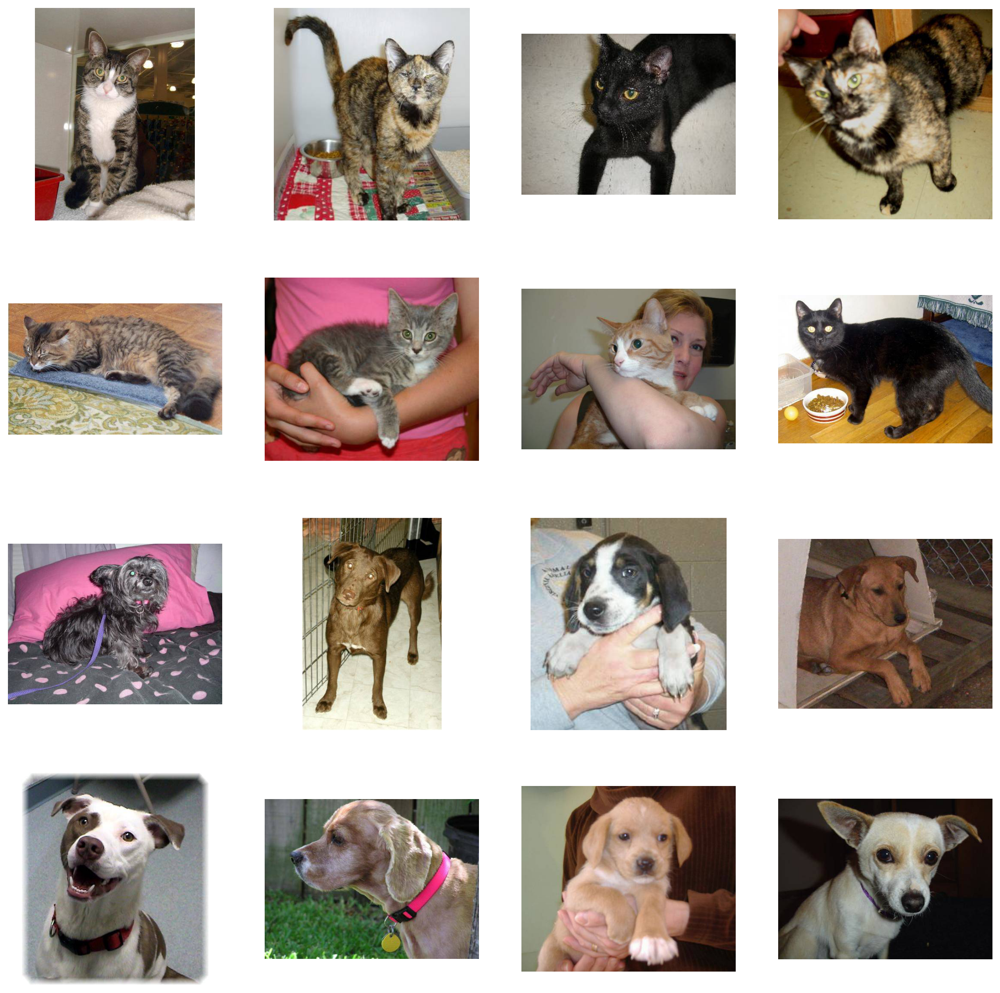

In [ ]:
# Set up matplotlib fig, and size it to fit 4x4 pics
fig = plt.gcf()
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index += 8
next_cat_pix = [os.path.join(train_cats_dir, fname) 
                for fname in train_cat_fnames[pic_index-8:pic_index]]
next_dog_pix = [os.path.join(train_dogs_dir, fname) 
                for fname in train_dog_fnames[pic_index-8:pic_index]]

for i, img_path in enumerate(next_cat_pix+next_dog_pix):
  # Set up subplot; subplot indices start at 1
  sp = plt.subplot(nrows, ncols, i + 1)
  sp.axis('Off') # Don't show axes (or gridlines)

  img = mpimg.imread(img_path)
  plt.imshow(img)

plt.show()


## Data Pre-Processing

Now we are **scaling** the data. While dealing with numeric features we must normalise and scale down features. Using raw input values might make the model biased towards features of that have high magnitude values so we must fine tune it. Pixels which have the original values of `[0, 255]` will be normalised into the `[0,1]`.

We are making two generators, one for training and one for validation.These data generators are converting the pictures into `float32` tensors so that we can feed them (with their labels) to our network. Thanks to the Keras library, the rescale parameter with the help of the `keras.preprocessing.image.ImageDataGenerator` class is used for preprocessing the images for rescaling from 255 pixels to binary pixels.


### Data Augmentation

In order for the model to avoid overfitting the data is "augmented" with the 

help of several random transformations. In the case of this study, we will augment the data in a way so that during training the **model will not see the same picture twice.** This can help the model learn to generalise results better.

Random transformations will be performed on the images read by the `ImageDataGenerator` instance.

Note that in this section instead of 20 batches being resized to 150x150 we're using 32 batches

In [ ]:
# Adding rescale, rotation_range, width_shift_range, height_shift_range,
# shear_range, zoom_range, and horizontal flip to our ImageDataGenerator
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
val_datagen = ImageDataGenerator(rescale=1./255)

# Flow training images in batches of 32 using train_datagen generator
train_generator = train_datagen.flow_from_directory(
        train_dir,  # This is the source directory for training images
        target_size=(150, 150),  # All images will be resized to 150x150
        batch_size=20,
        # Since we use binary_crossentropy loss, we need binary labels
        class_mode='binary')

# Flow validation images in batches of 32 using val_datagen generator
validation_generator = val_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


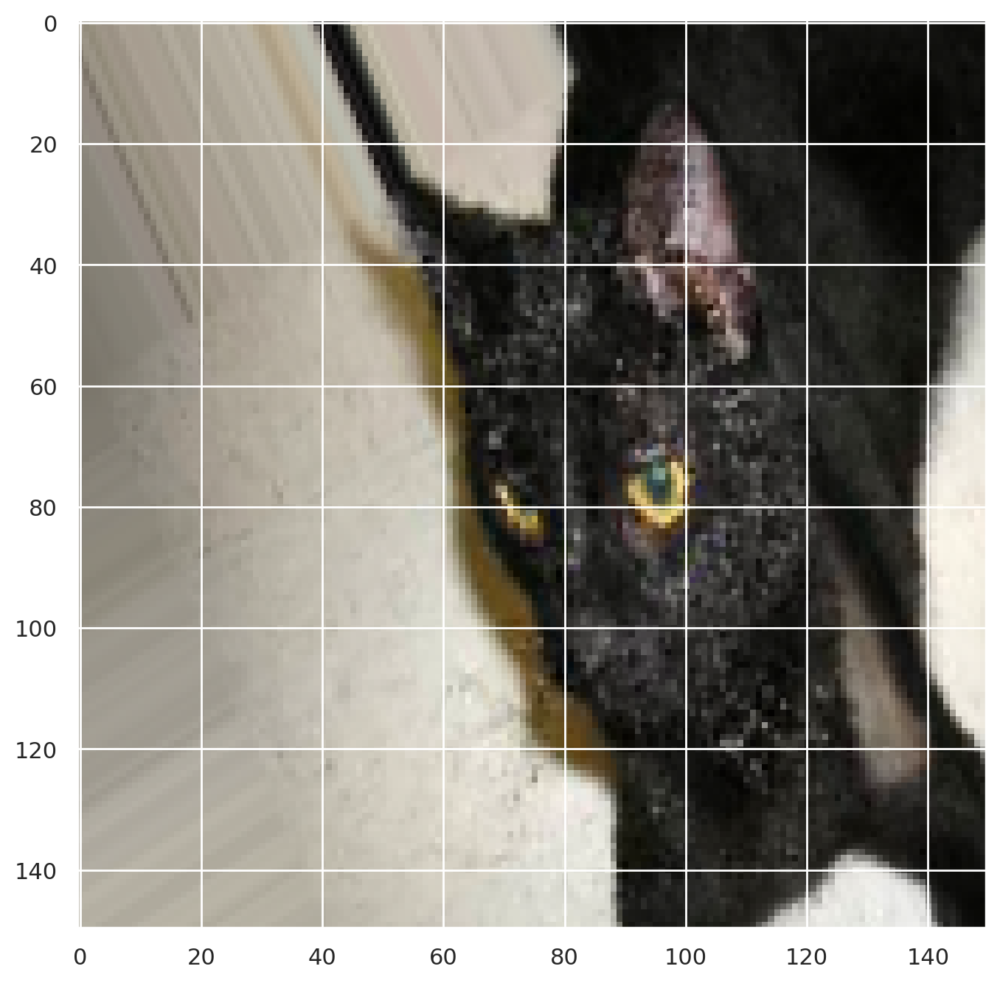

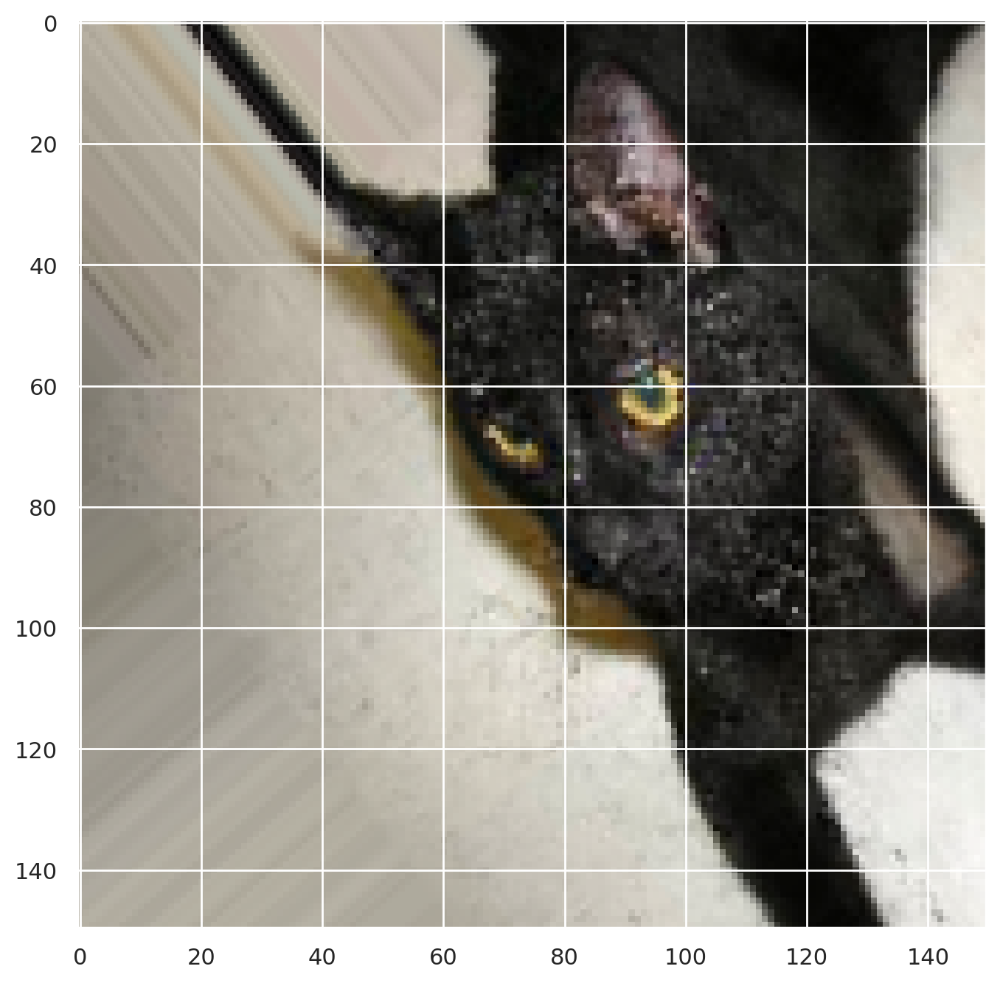

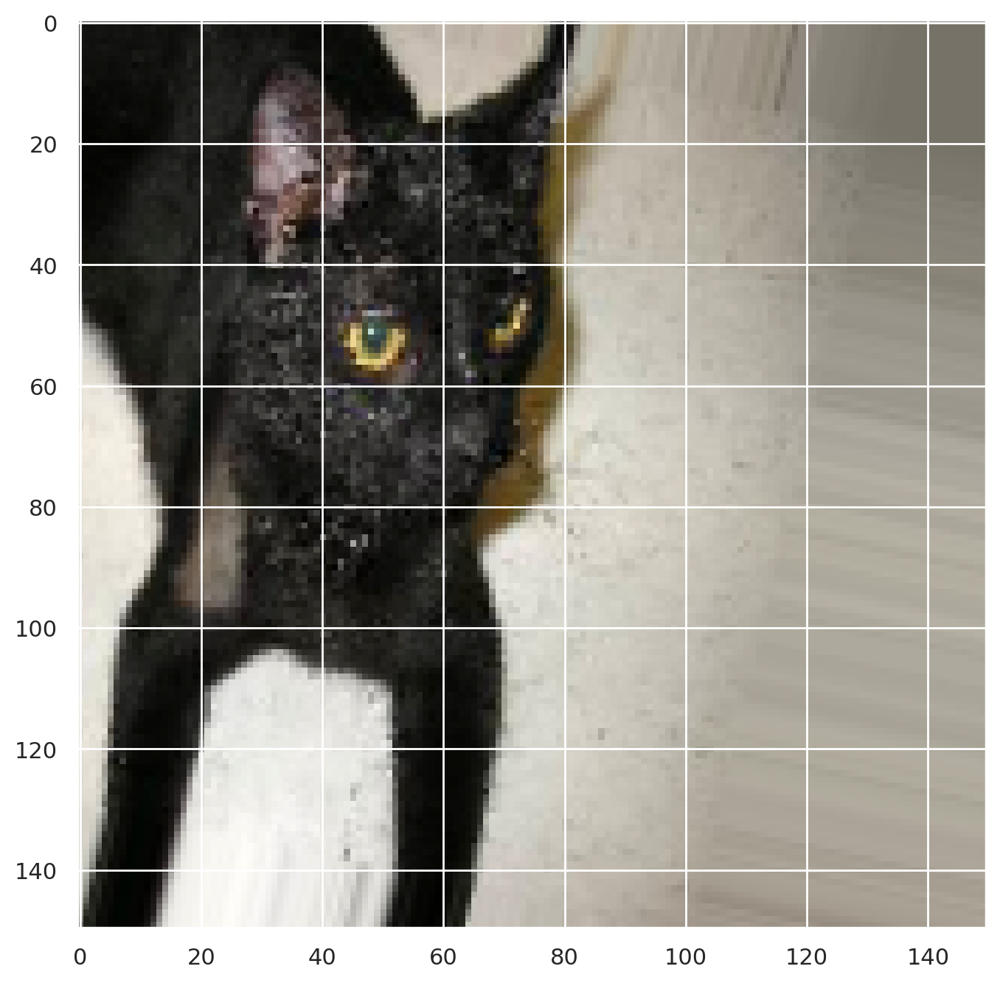

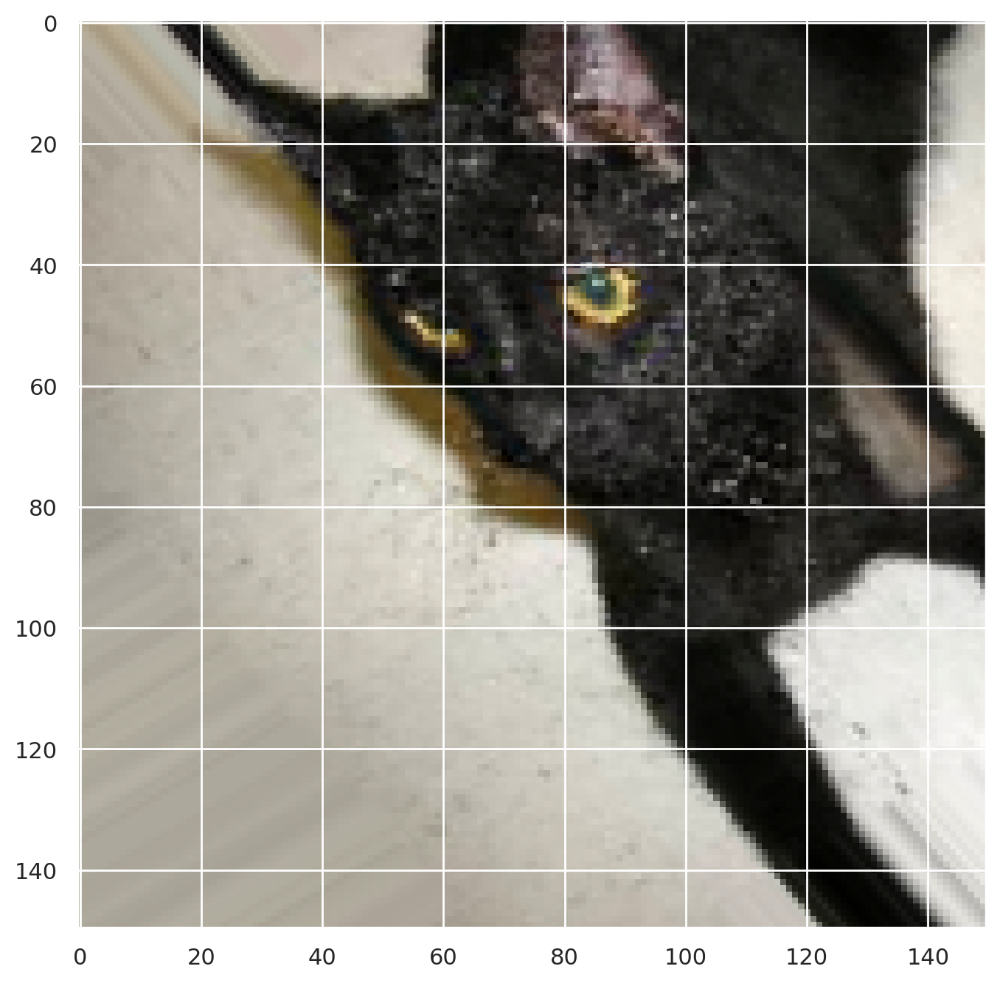

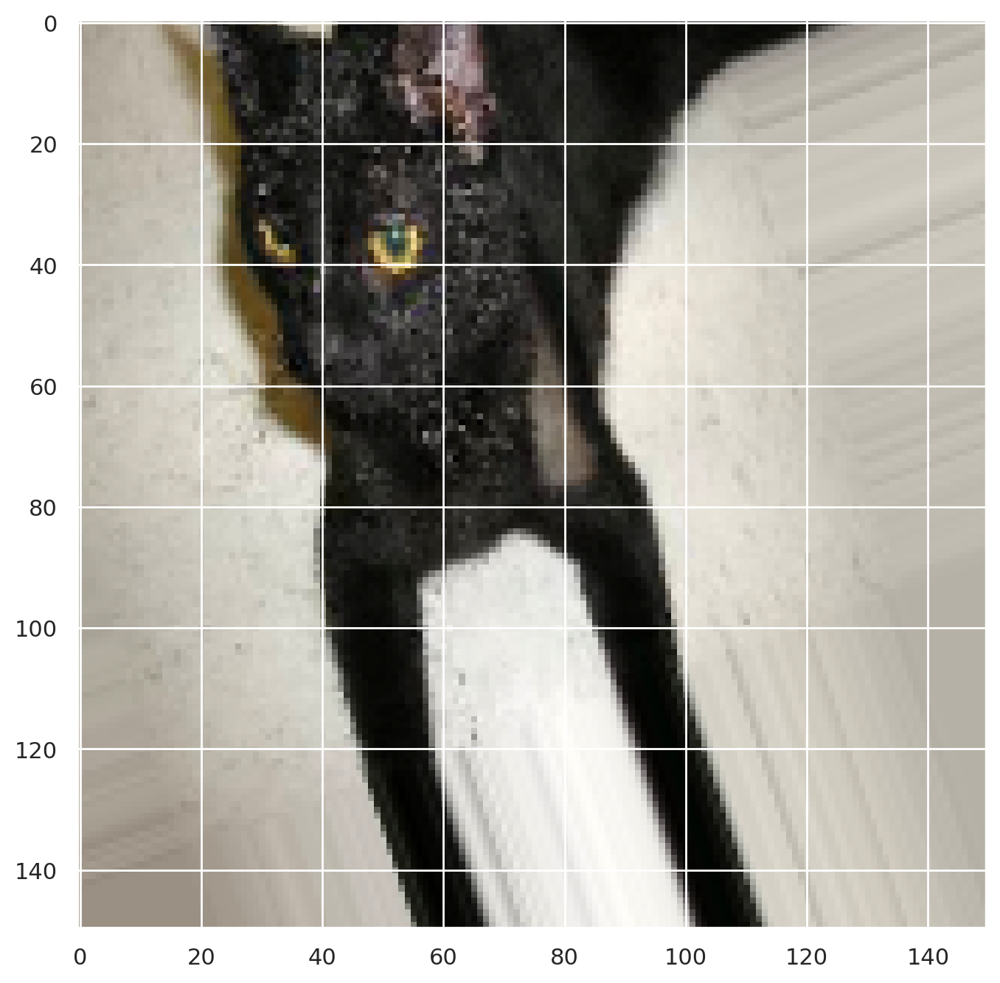

In [ ]:
%matplotlib inline

img_path = os.path.join(train_cats_dir, train_cat_fnames[2])
img = load_img(img_path, target_size=(150, 150))  # this is a PIL image
x = img_to_array(img)  # Numpy array with shape (150, 150, 3)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 150, 150, 3)

# The .flow() command below generates batches of randomly transformed images
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in train_datagen.flow(x, batch_size=1): # using an image from the train_datagen generator.
  plt.figure(i)
  imgplot = plt.imshow(array_to_img(batch[0]))
  i += 1
  if i % 5 == 0:
    break

# Building a Convolutional Network from Scratch

This section will deal with building the Convolutional Nueral Network.
The images that have been preprocessed in the section before this will be going into this Covnet which have all be resized and scaled to fit the model.

Creating the input feature map with 150x150 image pixels and 3 channels for colour (RGB channel). This is also where we create the layers for the CovNet.

The modules are stacked with three layers `[convolution + relu + maxpooling]`. The convolutions operate on 3x3 windows followed by the max pooling layers that operate on 2x2 windows.

Each convolution module extracts a different number of filter with the help of the layers. The first convolution extracts 16, then 32, and finally 64. Using three convolution modules keeps the model small which lowers the risk of overfitting and overall helps the model learn to better generalise results. 


In [ ]:

# Our input feature map is 150x150x3: 150x150 for the image pixels, and 3 for
# the three color channels: R, G, and B
img_input = layers.Input(shape=(150, 150, 3))

# First convolution extracts 16 filters that are 3x3
# Convolution is followed by max-pooling layer with a 2x2 window
x = layers.Conv2D(16, 3, activation='relu')(img_input)
x = layers.MaxPooling2D(2)(x)

# Second convolution extracts 32 filters that are 3x3
# Convolution is followed by max-pooling layer with a 2x2 window
x = layers.Conv2D(32, 3, activation='relu')(x)
x = layers.MaxPooling2D(2)(x)

# Third convolution extracts 64 filters that are 3x3
# Convolution is followed by max-pooling layer with a 2x2 window
x = layers.Conv2D(64, 3, activation='relu')(x)
x = layers.MaxPooling2D(2)(x)



The code below shows the addition of TWO fully connected layers. Since this is a `binary classification` problem with two classes to classify from (cat and dog) the network will end in a `sigmoid` activation so that the output of the network will be a single scalar between `[0, 1]`.
This encoding sets up the model to predict whether the current image is class 1 as opposed to class 0.

There is also the `dropout rate`.
This refers to: dropping out the nodes (input and hidden layer) in a neural network (as seen in Figure 1). All the forward and backwards connections with a dropped node are temporarily removed, thus creating a new network architecture out of the parent network.

In [ ]:

# Flatten feature map to a 1-dim tensor so we can add fully connected layers
x = layers.Flatten()(x)

# Create a fully connected layer with ReLU activation and 512 hidden units
x = layers.Dense(512, activation='relu')(x)

# Add a dropout rate of 0.5
x = layers.Dropout(0.5)(x)

# Create output layer with a single node and sigmoid activation
output = layers.Dense(1, activation='sigmoid')(x)

# Create model:
# input = input feature map
# output = input feature map + stacked convolution/maxpooling layers + fully 
# connected layer + dropout rate + sigmoid output layer
model = Model(img_input, output)

Summarizing the architecture below the summary includes the layer type, the output shape of that layer and the parameters. The output layer shows how the size of the `feature map` evolves thorughout the network. Thanks to the convolution layers the output size is reduced gradually due to pooling and padding done in the layers, cutting the outputs in half.

In [ ]:
model.summary()

Model: "model_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, 150, 150, 3)]     0         
                                                                 
 conv2d_146 (Conv2D)         (None, 148, 148, 16)      448       
                                                                 
 max_pooling2d_55 (MaxPoolin  (None, 74, 74, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_147 (Conv2D)         (None, 72, 72, 32)        4640      
                                                                 
 max_pooling2d_56 (MaxPoolin  (None, 36, 36, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_148 (Conv2D)         (None, 34, 34, 64)        184

And that's it, the model has been built.
Now the next step is to train it.

## Training Specifics

This section will deal with the specific configurations for the training of the model. The model is trained with `binary crossenthropy` because this is a binary classification problem with a learning rate of 0.001. During this training the accuracy metric is monitored, and the final activation is a sigmoid activation.

The training phase will be optimised with the RMSProp optimisation algorithm. This method is where the learning rate is divided for a weight by running the average of magnitudes of recent gradients for that weight.

**NOTE**: In this case, using the [RMSprop optimization algorithm](https://wikipedia.org/wiki/Stochastic_gradient_descent#RMSProp) is preferable to [stochastic gradient descent](https://developers.google.com/machine-learning/glossary/#SGD) (SGD), because RMSprop automates learning-rate tuning for us. (Other optimizers, such as [Adam](https://wikipedia.org/wiki/Stochastic_gradient_descent#Adam) and [Adagrad](https://developers.google.com/machine-learning/glossary/#AdaGrad), also automatically adapt the learning rate during training, and would work equally well here.)

In [ ]:
from tensorflow.keras.optimizers import RMSprop # importing RMSprop.

model.compile(loss='binary_crossentropy', # using binary cross enthropy to predict probability between class 0 or 1
              optimizer=RMSprop(learning_rate=0.001), # Optimiser = RMSProp + learning rate: 0.001
              metrics=['acc']) # keeping track of accuracy in the training of the model.

## Model Training


Now it's time to train on all the 2,000 images (1,000 cats vs 1,000 dogs). The training will take place within 30 epochs and be validated on all 1,000 validation images.

This is where once you run the cell, it will take some time to process. The bigger the dataset, the longer it takes for the training process. The more epochs (number of time an algorithm goes through training the entire dataset) the model goes through, with the help of transformations that aid with accuracy as well, the more accurate the model's outputs will be.

In [ ]:
history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,  # 2000 images = batch_size * steps
      epochs=50, # Configured for 15 epochs.
      validation_data=validation_generator,
      validation_steps=50,  # 1000 images = batch_size * steps
      verbose=2)

Epoch 1/50


<ipython-input-111-01e5073dffde>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


100/100 - 36s - loss: 0.6674 - acc: 0.6025 - val_loss: 0.6164 - val_acc: 0.6710 - 36s/epoch - 361ms/step
Epoch 2/50
100/100 - 18s - loss: 0.6524 - acc: 0.6360 - val_loss: 0.6105 - val_acc: 0.6860 - 18s/epoch - 185ms/step
Epoch 3/50
100/100 - 19s - loss: 0.6339 - acc: 0.6300 - val_loss: 0.6360 - val_acc: 0.6630 - 19s/epoch - 194ms/step
Epoch 4/50
100/100 - 18s - loss: 0.6181 - acc: 0.6605 - val_loss: 0.6075 - val_acc: 0.6510 - 18s/epoch - 180ms/step
Epoch 5/50
100/100 - 21s - loss: 0.6157 - acc: 0.6635 - val_loss: 0.6289 - val_acc: 0.6350 - 21s/epoch - 206ms/step
Epoch 6/50
100/100 - 19s - loss: 0.6093 - acc: 0.6650 - val_loss: 0.6360 - val_acc: 0.6720 - 19s/epoch - 193ms/step
Epoch 7/50
100/100 - 18s - loss: 0.6119 - acc: 0.6595 - val_loss: 0.5597 - val_acc: 0.7000 - 18s/epoch - 179ms/step
Epoch 8/50
100/100 - 18s - loss: 0.5969 - acc: 0.6825 - val_loss: 0.5429 - val_acc: 0.7050 - 18s/epoch - 178ms/step
Epoch 9/50
100/100 - 21s - loss: 0.5900 - acc: 0.6910 - val_loss: 0.5663 - val_acc:

## Model Evaluation

This section deals with the evalutation of accuracy and loss for the model. We will plot the training/validation accuracy and loss collected during the training process.

Text(0.5, 1.0, 'Training and validation loss')

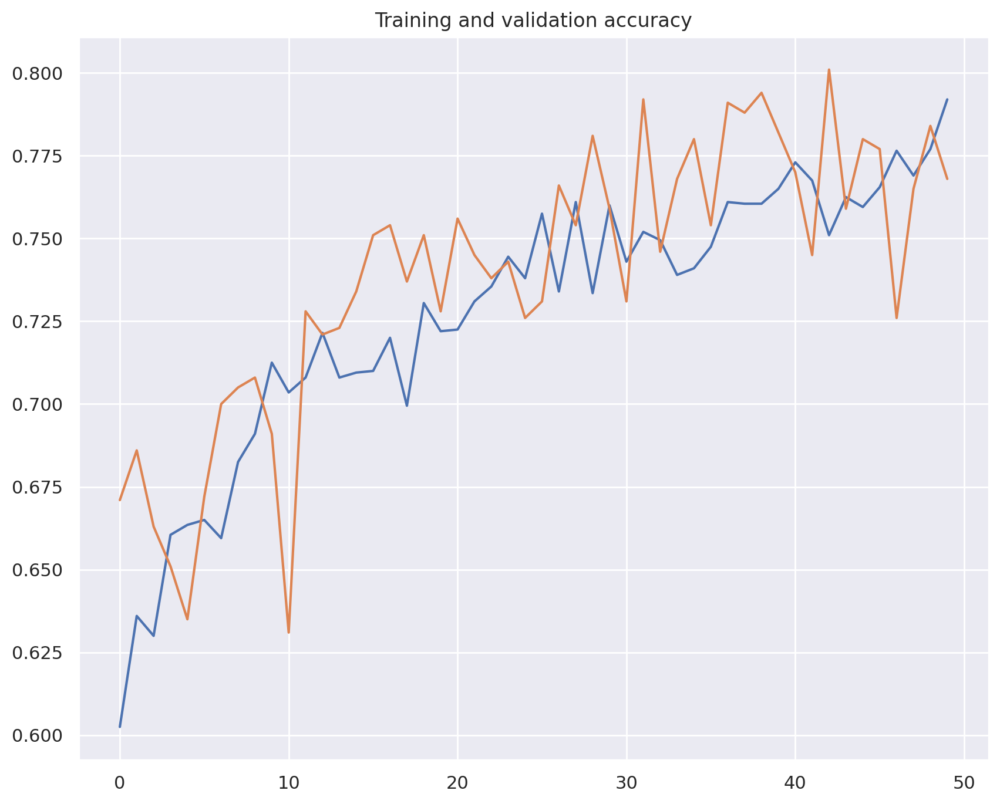

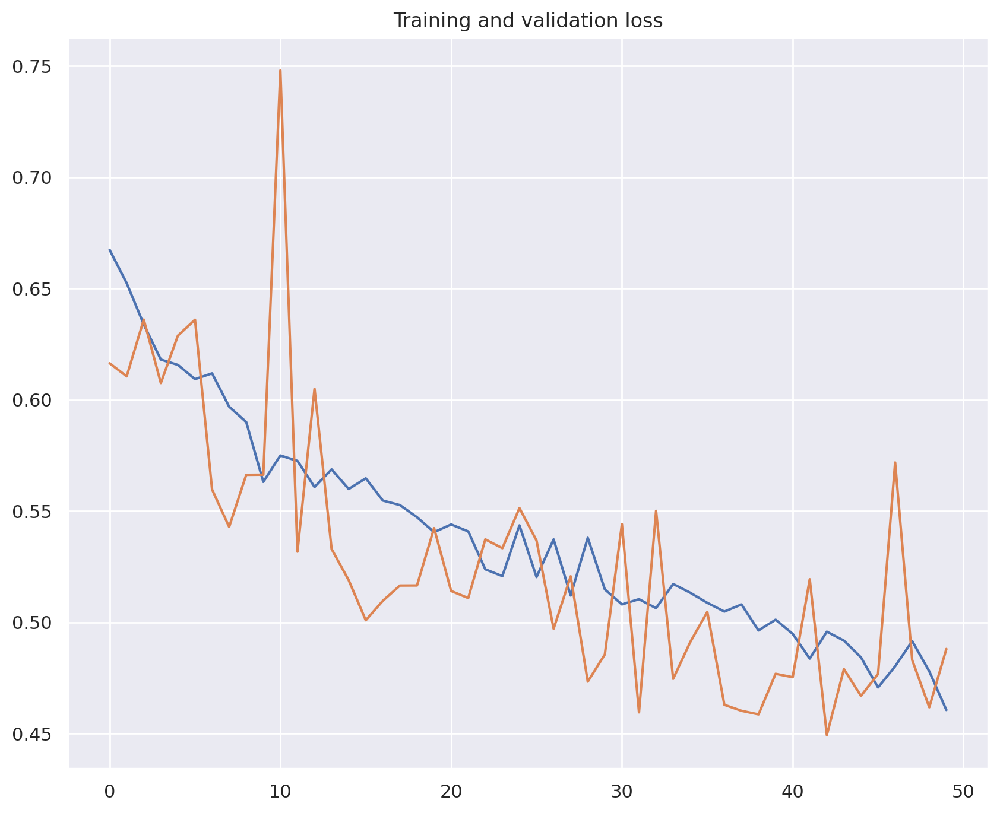

In [ ]:

# Retrieve a list of accuracy results on training and validation data
# sets for each training epoch
acc = history.history['acc']
val_acc = history.history['val_acc']

# Retrieve a list of list results on training and validation data
# sets for each training epoch
loss = history.history['loss']
val_loss = history.history['val_loss']

# Get number of epochs
epochs = range(len(acc))

# Plot training and validation accuracy per epoch
plt.plot(epochs, acc)
plt.plot(epochs, val_acc)
plt.title('Training and validation accuracy')

plt.figure()

# Plot training and validation loss per epoch
plt.plot(epochs, loss)
plt.plot(epochs, val_loss)
plt.title('Training and validation loss')


Will be explained in the report document.

## Visualising the Intermediate Representations.
This visualisation helps us understand what features the covnets has learned as it goes thorugh the covnet.

A random cat.dog image is picked from the training set and then a figure is generated where each row is the output of the layer. Each image in the row is a specificfilter from that output feature map.

If the cell is rerun a different representation with a different image is generated.

1/1 [==============================] - 0s 120ms/step


<ipython-input-114-5b2c47e747f5>:40: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std()


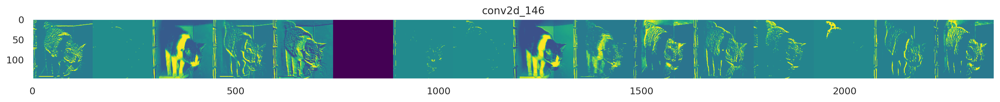

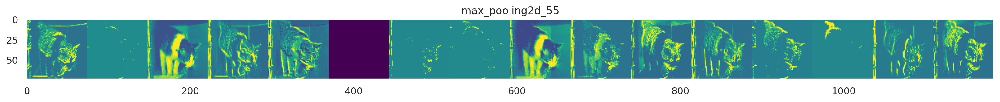

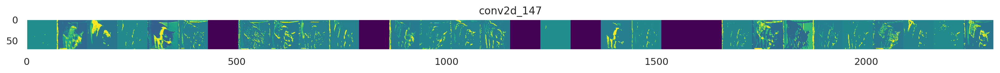

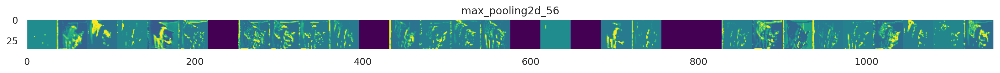

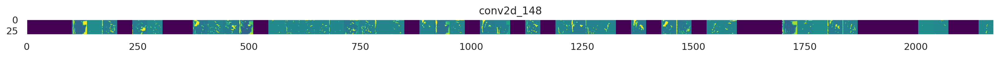

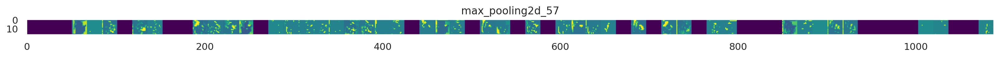

In [ ]:

# Let's define a new Model that will take an image as input, and will output
# intermediate representations for all layers in the previous model after
# the first.
successive_outputs = [layer.output for layer in model.layers[1:]]
visualization_model = Model(img_input, successive_outputs)

# Let's prepare a random input image of a cat or dog from the training set.
cat_img_files = [os.path.join(train_cats_dir, f) for f in train_cat_fnames]
dog_img_files = [os.path.join(train_dogs_dir, f) for f in train_dog_fnames]
img_path = random.choice(cat_img_files + dog_img_files)

img = load_img(img_path, target_size=(150, 150))  # this is a PIL image
x = img_to_array(img)  # Numpy array with shape (150, 150, 3)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 150, 150, 3)

# Rescale by 1/255
x /= 255

# Let's run our image through our network, thus obtaining all
# intermediate representations for this image.
successive_feature_maps = visualization_model.predict(x)

# These are the names of the layers, so can have them as part of our plot
layer_names = [layer.name for layer in model.layers[1:]]

# Now let's display our representations
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
  if len(feature_map.shape) == 4:
    # Just do this for the conv / maxpool layers, not the fully-connected layers
    n_features = feature_map.shape[-1]  # number of features in feature map
    # The feature map has shape (1, size, size, n_features)
    size = feature_map.shape[1]
    # We will tile our images in this matrix
    display_grid = np.zeros((size, size * n_features))

    for i in range(n_features):
      # Postprocess the feature to make it visually palatable
      x = feature_map[0, :, :, i]
      x -= x.mean()
      x /= x.std()
      x *= 64
      x += 128
      x = np.clip(x, 0, 255).astype('uint8')
      # We'll tile each filter into this big horizontal grid
      display_grid[:, i * size : (i + 1) * size] = x

    # Display the grid
    scale = 20. / n_features
    plt.figure(figsize=(scale * n_features, scale))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    

# A Bigger Convolutional Network

This section dives deeper into bigger convolutional networks, specifically the usage of `Pre-trained models`, these models have been trained on bigger databases. Using a pretained model can greatly improve the accuracy of a network. Pretrained models are used in smaller databases to extract the features that said model generates. Although pre-trained models may have been trained on a different task, any CNN model is easily adept to transfer learning where certain configurations may take place for it to fit the task at hand for the smaller database it is analysing.

This section deals with downloading said pretrained model, we will be using Inception V3, a pretrained model trained on ImageNet developed by google as well as load the pretrained weights it has used. 


---

We first need to pick the layers of the pretrained model that will be used for feature extraction, a common practice to use said model is to use the last layer called the `bottle neck layer` before the "flatten" operation. This is because the fully connected layers of the pre-trained model were trained for a different classification system (probably not a binary one which we are aiming for in this task). The bottleneck layers however are able to retain generality. Here we are downloading Inception V3's weights:

In [ ]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O /tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

--2023-04-16 03:15:48--  https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5
Resolving storage.googleapis.com (storage.googleapis.com)... 142.251.12.128, 172.217.194.128, 172.253.118.128, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|142.251.12.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87910968 (84M) [application/x-hdf]
Saving to: ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’

/tmp/inception_v3_w 100%[===================>]  83.84M  17.4MB/s    in 6.0s    

2023-04-16 03:15:54 (14.0 MB/s) - ‘/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5’ saved [87910968/87910968]



In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3

local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'
pre_trained_model = InceptionV3(
    input_shape=(150, 150, 3), include_top=False, weights=None)
pre_trained_model.load_weights(local_weights_file)

As you can see, we are making sure that the **top layers** of the pre-trained model is not being included when we loaded in with the `include_top=False` argument.

Next, the model we have loaded will be untrainable since it is only used for feature extraction. We are not updating it's weights during training.

In [ ]:
for layer in pre_trained_model.layers:
  layer.trainable = False

We will be using the `mixed7` layer which is used to keep a 7x7 feature map. We will define this as `last_output`.

In [ ]:
last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape:', last_layer.output_shape)
last_output = last_layer.output

last layer output shape: (None, 7, 7, 768)


We are now going to stick a fully connected layer on top of the last output.

In [ ]:

# Flatten the output layer to 1 dimension
x = layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = layers.Dropout(0.2)(x)
# Add a final sigmoid layer for classification
x = layers.Dense(1, activation='sigmoid')(x)

# Configure and compile the model
model = Model(pre_trained_model.input, x)
model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(learning_rate=0.0001),
              metrics=['acc'])


Getting a look at the model, we can see the layers of the architecture. Not only  is it bigger than the model we trained from scratch but we can learn from this model's architecture's structure.

In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                            

Now we can train the model we loaded with the 2,000

In [ ]:
history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=4,
      validation_data=validation_generator,
      validation_steps=50,
      verbose=2)

<ipython-input-23-af10b7d2fe6c>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/4
100/100 - 22s - loss: 0.1828 - acc: 0.9295 - val_loss: 0.0956 - val_acc: 0.9650 - 22s/epoch - 216ms/step
Epoch 2/4
100/100 - 23s - loss: 0.1847 - acc: 0.9305 - val_loss: 0.0962 - val_acc: 0.9620 - 23s/epoch - 227ms/step
Epoch 3/4
100/100 - 20s - loss: 0.1632 - acc: 0.9325 - val_loss: 0.0973 - val_acc: 0.9670 - 20s/epoch - 201ms/step
Epoch 4/4
100/100 - 21s - loss: 0.1629 - acc: 0.9385 - val_loss: 0.1058 - val_acc: 0.9590 - 21s/epoch - 210ms/step


As we can see this bigger model (pretrained) has a high accuracy rate an a low loss value, it's learned very quickly regarding our dataset. We can visualise this as seen below.

Text(0.5, 1.0, 'Training and validation loss')

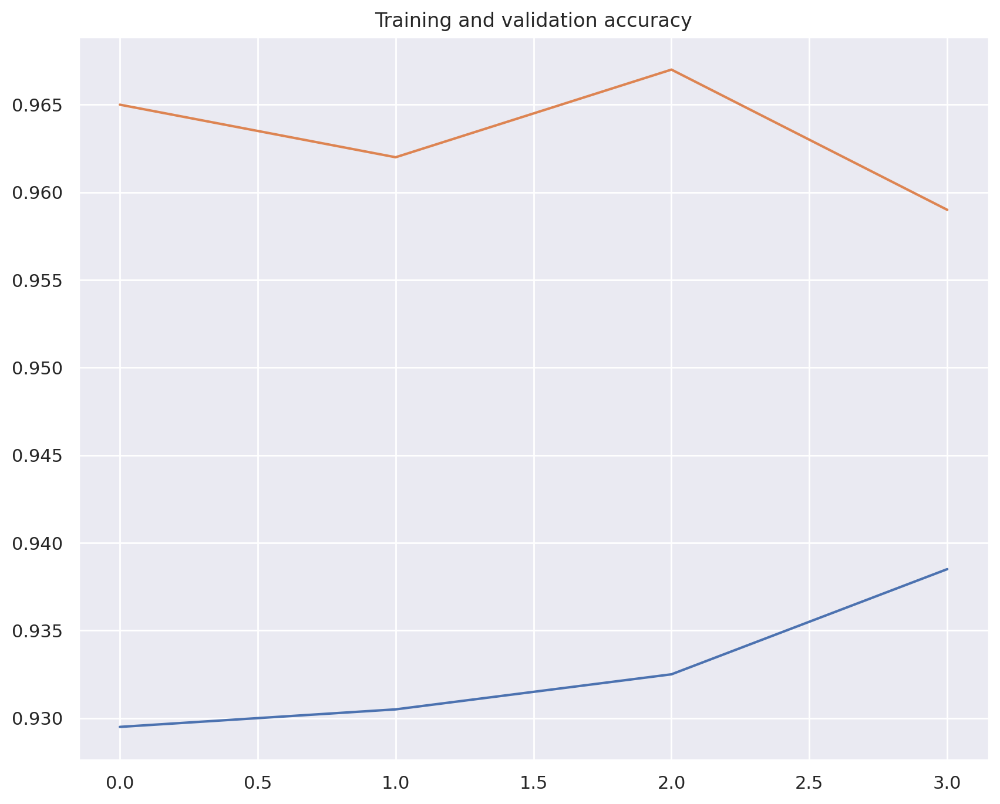

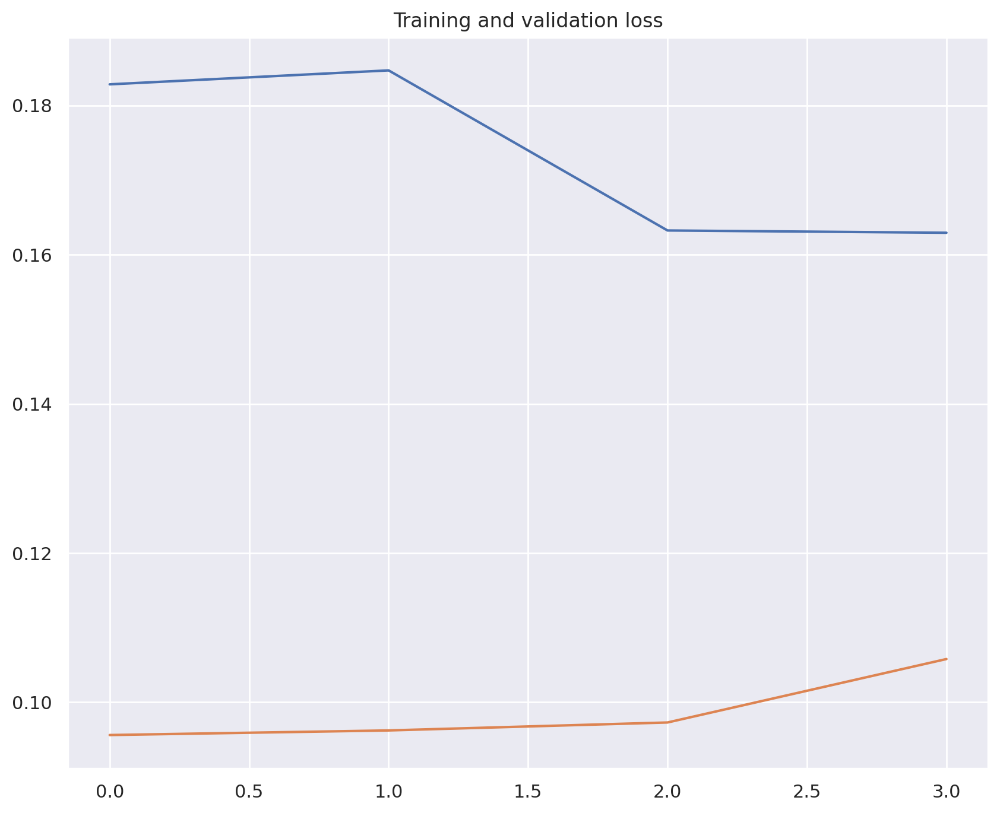

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Retrieve a list of accuracy results on training and validation data
# sets for each training epoch
acc = history.history['acc']
val_acc = history.history['val_acc']

# Retrieve a list of list results on training and validation data
# sets for each training epoch
loss = history.history['loss']
val_loss = history.history['val_loss']

# Get number of epochs
epochs = range(len(acc))

# Plot training and validation accuracy per epoch
plt.plot(epochs, acc)
plt.plot(epochs, val_acc)
plt.title('Training and validation accuracy')

plt.figure()

# Plot training and validation loss per epoch
plt.plot(epochs, loss)
plt.plot(epochs, val_loss)
plt.title('Training and validation loss')

Metrics will be explained in the report doc.

# Copyright 2018 Google LLC.
Credits goes to Google LLC.

In [ ]:
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.